## UTILIZANDO BERT PARA PREVER A POPULARIDADE DE POSTAGENS NO YOUTUBE

Esta proposta de pesquisa científica é um trabalho de conclusão de curso de Ciência da Computação, desenvolvido pelo aluno Leonardo Mafra Salin.

O objetivo deste protótipo é compreender as bases de estudos que são referentes à coleta de dados de canais e vídeos no YouTube realizada em estudo anterior pelo PPGIA, e em sequência gerar previsões de popularidade nas publicações, se beneficiando do processamento de linguagem natural nos títulos e descrições disponíveis.

Desta maneira, serão realizados experimentos a fim de avaliar os impactos do processamento dos textos contidos nas bases de estudo.

## Bibliotecas

In [1]:
from libs import *
from utils import *

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\domaf\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Descomentar caso execução seja feita no Google Drive
"""
from google.colab import drive
drive.mount('/content/drive')
"""

"\nfrom google.colab import drive\ndrive.mount('/content/drive')\n"

## Análise Exploratória dos Dados (EDA)

In [3]:
# Carregando datasets
url_videos = 'https://raw.githubusercontent.com/domafras/prototipo_v1/master/datasets/dataset_videos.csv'
url_canais = 'https://raw.githubusercontent.com/domafras/prototipo_v1/master/datasets/dataset_canais.csv'

df_videos = pd.read_csv(url_videos, index_col=0)
df_canais = pd.read_csv(url_canais, index_col=0)

# Juntando datasets pela coluna 'channel_id'
df = df_canais.merge(df_videos, on='channel_id')

No caso da união dos dataframes 'df_canais' e 'df_videos' usando o método merge(), tem-se a coluna 'channel_id' como chave para unir as duas tabelas.

As colunas que possuem o mesmo nome entre os dois dataframes terão o sufixo:
- _x no nome para referenciar a coluna do dataframe esquerdo (df_canais)
- _y para referenciar a coluna do dataframe direito (df_videos)

In [4]:
# Dados em df único
df.head(1)

,channel_id,url_channel,category,gender,channel_name_x,country,year,channel_description,comment_count_x,video_count,view_count_x,subscriber_count,aux_status,updated_at_x,next_page_token,channel_name_y,video_title,video_desc,comment_count_y,dislike_count,favorite_count,view_count_y,like_count,video_duration,published_at,updated_at_y
0,UC1ObFmPG3RzIGijhe6i3fmg,https://www.youtube.com/channel/UC1ObFmPG3RzIG...,Viagem e Turismo,A,WeLove,Brasil,2014,Manu e Matheus\nTRAVEL - LOVE - ADVENTURE - VL...,0,89,6013953,168000,1,2020-10-14 9:56:51,NaN,WeLove,MELHORE SEUS VÍDEOS COM ESSA TÉCNICA DE TRANSI...,MANU E MATHEUS - @welove - NOSSO INSTAGRAM - h...,279.0,18.0,0.0,36113.0,3923.0,PT11M43S,2020-03-22 23:55:52,2020-10-14 9:55:18


In [5]:
# Número de linhas, colunas e seus tipos
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38427 entries, 0 to 38426
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   channel_id           38427 non-null  object 
 1   url_channel          38427 non-null  object 
 2   category             38427 non-null  object 
 3   gender               38427 non-null  object 
 4   channel_name_x       38427 non-null  object 
 5   country              38427 non-null  object 
 6   year                 38427 non-null  int64  
 7   channel_description  37031 non-null  object 
 8   comment_count_x      38427 non-null  int64  
 9   video_count          38427 non-null  int64  
 10  view_count_x         38427 non-null  int64  
 11  subscriber_count     38427 non-null  int64  
 12  aux_status           38427 non-null  int64  
 13  updated_at_x         38427 non-null  object 
 14  next_page_token      3390 non-null   object 
 15  channel_name_y       38427 non-null 

In [6]:
# Verificando dimensão de vídeos e canais separadamente
print(df_videos.shape)
print(df_canais.shape)

(38427, 12)
(103, 14)


Inicialmente, tem-se:
- Total de canais: 103
- Toral de vídeos: 38427

**Dicionário: Canais**
- url_channel:	Url do canal
- category:	Categoria do canal
- gender: Gênero do canal
- channel_name:	Nome do canal
- country:	País do Canal
- year:	Ano de Criação
- channel_description:	Descrição do canal
- comment_count:	Número de comentários
- video_count:	Total de vídeos publicados
- view_count: Total de visualizações do canal
- subscriber_count: Total de inscritos
- aux_status: Status de canal ativo
- updates_at: Última atualização do canal

**Dicionário: Vídeos**
- channel_id:	Id do canal de origem
- channel_name:	Nome do canal
- video_title:	Título do vídeo
- video_desc:	Descrição do vídeo
- comment_count:	Número de comentários
- dislike_count:	Número de dislikes
- view_count:	Número de views
- like_count:	Númerdo de likes 
- video_duration:	Duração do vídeo
- published_at:	Data de publicação do vídeo

In [7]:
# Verificando dimensão inicial (linha, coluna)
df.shape

(38427, 26)

In [8]:
# Verificando duplicados
print(f'Número de linhas duplicadas: {df.duplicated().sum()}')

Número de linhas duplicadas: 0


Nem todos os valores ausentes estão representados por NaN. Por isso, verifica-se outra representação desses valores (-999).

In [9]:
# Visualiza em ordem decrescente features com valores -999
count999 = df[df==-999].count().sort_values(ascending=False)
count999

comment_count_y        1077
like_count               25
dislike_count            25
view_count_y             21
channel_id                0
url_channel               0
published_at              0
video_duration            0
favorite_count            0
video_desc                0
video_title               0
channel_name_y            0
next_page_token           0
updated_at_x              0
aux_status                0
subscriber_count          0
view_count_x              0
video_count               0
comment_count_x           0
channel_description       0
year                      0
country                   0
channel_name_x            0
gender                    0
category                  0
updated_at_y              0
dtype: int64

Substituindo representações -999 por NaN, para auxiliar tratamento no futuro:

In [10]:
# Substitui valores -999 por NaN
df.replace(-999, np.nan, inplace=True)

In [11]:
# Verificando valores faltantes
df.isnull().sum().sort_values(ascending = False)

next_page_token        35037
channel_description     1396
comment_count_y         1105
video_desc               799
like_count                53
dislike_count             53
view_count_y              49
published_at              28
video_duration            28
favorite_count            28
channel_id                 0
video_title                0
channel_name_y             0
updated_at_x               0
url_channel                0
aux_status                 0
subscriber_count           0
view_count_x               0
video_count                0
comment_count_x            0
year                       0
country                    0
channel_name_x             0
gender                     0
category                   0
updated_at_y               0
dtype: int64

In [12]:
# Verificando valores distintos em cada coluna
df.nunique().sort_values(ascending = True)

favorite_count             1
country                    1
comment_count_x            1
aux_status                 2
gender                     5
next_page_token            8
year                      15
category                  26
updated_at_x              83
channel_description       98
subscriber_count         100
video_count              101
channel_name_y           103
channel_id               103
view_count_x             103
channel_name_x           103
url_channel              103
updated_at_y            1117
video_duration          3519
dislike_count           4546
comment_count_y         6716
like_count             27543
video_desc             28653
view_count_y           36801
published_at           37765
video_title            38379
dtype: int64

Colunas que só têm um tipo de resposta geralmente não fornecem muita informação útil para o modelo. 

Na verdade, colunas "constantes" podem ser removidas do conjunto de dados sem afetar o desempenho do modelo, a exemplo de:
- 'country': contempla apenas "Brasil", sendo o escopo da extração realizada
- 'favorite_count' : contempla apenas "0.0" pois não existe mais favorito na plataforma
- 'comment_count_x': contempla apenas "0", já que nesse momento não foram extraídos comentários

In [13]:
# Verificando tipo atual dos dados
df.dtypes.unique()

array([dtype('O'), dtype('int64'), dtype('float64')], dtype=object)

Retornando maior valor de cada feature, a fim de verificar ordem de magnitude do conjunto de dados após a substituição dos valores -999:

In [14]:
# Calculando as estatísticas descritivas para cada coluna
desc = df.describe()

# Selecionando apenas as linhas que contêm o mínimo, médio e máximo
desc_min_max_mean = desc.loc[['min', 'mean', 'max']]

# Imprimindo as estatísticas descritivas para cada coluna
desc_min_max_mean

,year,comment_count_x,video_count,view_count_x,subscriber_count,aux_status,comment_count_y,dislike_count,favorite_count,view_count_y,like_count
min,2005.000000,0.0,15.00000,9.559600e+04,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000e+00
mean,2012.371458,0.0,1341.99607,7.297652e+08,4.468870e+06,0.927056,1921.065886,870.629332,0.0,6.910201e+05,5.479755e+04
max,2020.000000,0.0,9576.00000,1.104421e+10,4.110000e+07,1.000000,234624.000000,132490.000000,0.0,8.894125e+07,5.527981e+06


## Insights

In [15]:
# Estatísticas descritivas
df.describe()

,year,comment_count_x,video_count,view_count_x,subscriber_count,aux_status,comment_count_y,dislike_count,favorite_count,view_count_y,like_count
count,38427.000000,38427.0,38427.000000,3.842700e+04,3.842700e+04,38427.000000,37322.000000,38374.000000,38399.0,3.837800e+04,3.837400e+04
mean,2012.371458,0.0,1341.996070,7.297652e+08,4.468870e+06,0.927056,1921.065886,870.629332,0.0,6.910201e+05,5.479755e+04
std,3.148999,0.0,1528.269923,1.575297e+09,6.669482e+06,0.260047,5832.506041,3060.697619,0.0,2.264239e+06,1.795371e+05
min,2005.000000,0.0,15.000000,9.559600e+04,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000e+00
25%,2010.000000,0.0,458.000000,8.919040e+07,9.200000e+05,1.000000,177.000000,55.000000,0.0,5.411675e+04,4.310750e+03
50%,2013.000000,0.0,803.000000,2.249328e+08,2.380000e+06,1.000000,601.000000,192.000000,0.0,1.882715e+05,1.671950e+04
75%,2015.000000,0.0,1635.000000,5.048537e+08,5.420000e+06,1.000000,1639.000000,603.000000,0.0,5.530340e+05,4.829675e+04
max,2020.000000,0.0,9576.000000,1.104421e+10,4.110000e+07,1.000000,234624.000000,132490.000000,0.0,8.894125e+07,5.527981e+06


#### 'year': (ano de criação do canal)

Com base nos dados apresentados, podemos retirar insights sobre o ano de criação de um canal do YouTube:

- A média do ano de criação dos canais é 2012.
- O desvio padrão (std) é relativamente baixo, respeitando a distribuição dos anos de existência da plataforma.
- O ano mínimo de criação de canal é 2005, significando que tem canal criado no mesmo ano da criação do YouTube.
- O ano máximo de criação é 2020 (ano da coleta dos dados), o que indica que a plataforma continua atraindo novos criadores de conteúdo e se mantendo relevante no mercado.

#### 'video_count': (quantidade de vídeos publicados do canal)

Com base nos dados apresentados, podemos retirar insights sobre a quantidade de vídeos já publicados em um canal do YouTube:

- A média de vídeos publicados é de 1342, o que sugere que existem muitos canais com um grande número de vídeos.
- O desvio padrão é relativamente alto (1529), o que indica que há uma grande variação na quantidade de vídeos publicados pelos canais.
- O valor mínimo é de apenas 15 vídeos, enquanto o máximo é de 9576, mostrando a grande amplitude dos dados.
- A maioria dos canais (50%) possui entre 458 e 1635 vídeos publicados.

#### 'view_count_x': (quantidade de visualizações geral do canal)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de visualizações de um canal no YouTube.

- O número médio de visualizações é de cerca de 730 milhões, o que indica que canais com uma grande quantidade de visualizações podem ser considerados como excepcionais em relação à média.
- O desvio padrão é bastante alto, o que sugere que há uma grande variabilidade nos números de visualizações entre os diferentes canais do YouTube. Isso pode ser explicado por diferentes fatores, como a qualidade e a relevância do conteúdo, as estratégias de marketing utilizadas, entre outros.
- O valor mínimo de visualizações é de 95.596, o que indica que existem canais com poucas visualizações no YouTube. Por outro lado, o valor máximo é de mais de 11 bilhões, o que sugere que existem canais altamente populares que recebem uma quantidade extraordinária de visualizações.
- Os quartis indicam que 25% dos canais têm menos de 89 milhões de visualizações, 50% têm menos de 225 milhões de visualizações e 75% têm menos de 504 milhões de visualizações. Essas informações podem ser úteis para definir metas e objetivos em relação ao número de visualizações de um canal no YouTube.

#### 'subscriber_count': (quantidade de inscritos do canal)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de inscritos de um canal no YouTube.

- O número médio de inscritos nos canais do YouTube analisados é de cerca de 4,5 milhões.
- A maioria dos canais do YouTube tem menos de 5,4 milhões de inscritos (75% das observações).
- O valor mínimo de inscritos é 0, o que pode indicar canais que foram desativados ou excluídos.
- O valor máximo de inscritos é de cerca de 41,1 milhões, o que sugere a presença de canais populares e bem estabelecidos na plataforma.
- A mediana (50%) de inscritos é de 2,38 milhões, o que significa que metade dos canais tem menos de 2,38 milhões de inscritos e metade tem mais.

#### 'aux_status': (canal ativo ou não)

Com base nos dados apresentados, podemos retirar alguns insights sobre o status de um canal no YouTube.

- A coluna "aux_status" do YouTube tem um valor médio de 0,93.
- O valor mínimo de aux_status é 0, o que pode indicar canais que foram desativados ou excluídos.
- O valor máximo de aux_status é 1, o que sugere que a grande maioria dos canais da amostra está ativa.

Esses insights sugerem que a coluna "aux_status" é uma variável binária que indica se um canal está ativo ou não. Como quase todos os canais têm um valor de 1 na coluna "aux_status", podemos concluir que a grande maioria dos canais da amostra está ativa. No entanto, a presença de alguns valores 0 pode ser analisada para entender melhor por que esses canais estão inativos.

*Os valores apresentados nessa coluna podem refletir nas demais.

#### 'view_count_y': (quantidade de visualizações de um vídeo)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de visualizações em um vídeo no YouTube.

- A média de visualizações por vídeo é de aproximadamente 691.350.
- O desvio padrão é bastante elevado (2.264.924), o que indica uma grande variabilidade nos dados.
- O valor mínimo de visualizações em um vídeo é 0, o que pode indicar que alguns vídeos não foram assistidos.*
- O primeiro quartil (25%) indica que 25% dos vídeos possuem até 54.151 visualizações.
- A mediana (50%) indica que metade dos vídeos possui até 188.476 visualizações.
- O terceiro quartil (75%) indica que 75% dos vídeos possuem até 553.166 visualizações.
- O valor máximo de visualizações em um vídeo é de 88.941.250, o que sugere a presença de outliers na distribuição.

#### 'like_count': (quantidade de curtidas em um vídeo)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de likes em um vídeo no YouTube.

- A média de likes por vídeo é de aproximadamente 54.826.
- O desvio padrão é bastante elevado (179.582), o que indica uma grande variabilidade nos dados.
- O valor mínimo de likes em um vídeo é 0, o que sugere que alguns vídeos não possuem nenhum like.*
- O primeiro quartil (25%) indica que 25% dos vídeos possuem até 4.322 likes.
- A mediana (50%) indica que metade dos vídeos possui até 16.735 likes.
- O terceiro quartil (75%) indica que 75% dos vídeos possuem até 48.310 likes.
- O valor máximo de likes em um vídeo é de 5.527.981, o que sugere a presença de outliers na distribuição.

#### 'dislike_count': (quantidade de descurtidas em um vídeo)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de dislikes em um vídeo no YouTube.

- A média de dislikes por vídeo é de aproximadamente 871.
- O desvio padrão é bastante elevado (3061), o que indica uma grande variabilidade nos dados.
- O valor mínimo de dislikes em um vídeo é 0, o que sugere que alguns vídeos não possuem nenhum dislike.*
- O primeiro quartil (25%) indica que 25% dos vídeos possuem até 55 dislikes.
- A mediana (50%) indica que metade dos vídeos possui até 192 dislikes.
- O terceiro quartil (75%) indica que 75% dos vídeos possuem até 603 dislikes.
- O valor máximo de dislikes em um vídeo é de 132490, o que sugere a presença de outliers na distribuição.

#### 'comment_count_y': (quantidade de comentários em um vídeo)

Com base nos dados apresentados, podemos retirar alguns insights sobre a quantidade de comentários em um vídeo no YouTube.

- A média de comentários por vídeo é de aproximadamente 1.922 comentários.
- O desvio padrão é bastante elevado (5.835), indicando uma grande variabilidade nos dados.
- O valor mínimo de comentários em um vídeo é 0, o que pode indicar que alguns vídeos possuem poucos ou nenhum comentário.
- O primeiro quartil (25%) indica que 25% dos vídeos possuem até 178 comentários.
- A mediana (50%) indica que metade dos vídeos possui até 602 comentários.
- O terceiro quartil (75%) indica que 75% dos vídeos possuem até 1640 comentários.
- O valor máximo de comentários em um vídeo é de 234624, o que sugere a presença de outliers na distribuição.

In [16]:
# Visualizando dispersão entre visualizações e curtidas em um vídeo
fig = px.scatter(df, x='view_count_y', y='like_count', trendline='ols', width=600, height=400,
                 title='Dispersão entre visualizações e curtidas')
fig.show()

In [17]:
# Visualizando dispersão entre visualizações e descurtidas em um vídeo
fig = px.scatter(df, x='view_count_y', y='dislike_count', trendline='ols', width=600, height=400,
                 title='Dispersão entre visualizações e descurtidas')
fig.show()

In [18]:
# Visualizando dispersão entre visualizações e comentários em um vídeo
fig = px.scatter(df, x='view_count_y', y='comment_count_y', trendline='ols', width=600, height=400,
                 title='Dispersão entre visualizações e comentários')
fig.show()

Verifica-se que a quantidade de metadados de interação (curtidas, descurtidas e comentários) geralmente tem relação com a quantidade de visualizações que um vídeo atinge. 

## Analisando variáveis categóricas

In [19]:
# Análisando variáveis categoricas
df_cat = df.select_dtypes(include=['object'])
df_cat.columns

Index(['channel_id', 'url_channel', 'category', 'gender', 'channel_name_x',
       'country', 'channel_description', 'updated_at_x', 'next_page_token',
       'channel_name_y', 'video_title', 'video_desc', 'video_duration',
       'published_at', 'updated_at_y'],
      dtype='object')

#### 'category':

In [20]:
qtde_valores_distintos = df['category'].nunique()
print('Quantidade de valores distintos na coluna "category":', qtde_valores_distintos)

valores_distintos = df['category'].unique()
print('\nValores distintos na coluna "category":', valores_distintos)

Quantidade de valores distintos na coluna "category": 26

Valores distintos na coluna "category": ['Viagem e Turismo' 'Tecnologia Digital' 'Decoração, Organização e Diy'
 'Política' 'Moda' 'Pets' 'Games' 'Beleza' 'Saúde' 'Esporte' 'Fitness'
 'Família' 'Educação' 'Gastronomia' 'Empreendedorismo e Negócios'
 'Comportamento e Estilo de Vida' 'Cidades, Arquitetura e Urbanismo'
 'Meio Ambiente e Sustentabilidade' 'Economia, Política e Atualidades'
 'Humor' 'Militar' 'Ciências' 'História' 'Programação'
 'Cultura e Entretenimento' 'Conhecimento e Curiosidades']


#### 'gender':

In [21]:
qtde_valores_distintos = df['gender'].nunique()
print('Quantidade de valores distintos na coluna "gender":', qtde_valores_distintos)

valores_distintos = df['gender'].unique()
print('\nValores distintos na coluna "gender":', valores_distintos)

Quantidade de valores distintos na coluna "gender": 5

Valores distintos na coluna "gender": ['A' 'B' 'F' 'M' 'N']


#### 'updated_at_x':

In [22]:
qtde_valores_distintos = df['updated_at_x'].nunique()
print('Quantidade de valores distintos na coluna "updated_at_x":', qtde_valores_distintos)

valores_distintos = df['updated_at_x'].unique()
print('\nValores distintos na coluna "updated_at_x":', valores_distintos)

Quantidade de valores distintos na coluna "updated_at_x": 83

Valores distintos na coluna "updated_at_x": ['2020-10-14 9:56:51' '2020-10-14 22:31:29' '2020-10-15 9:33:29'
 '2020-10-14 22:37:23' '2020-10-15 9:41:15' '2020-10-14 10:54:42'
 '2020-10-14 22:33:44' '2020-10-14 9:30:04' '2020-10-15 15:26:59'
 '2020-10-15 9:40:13' '2020-10-14 9:39:53' '2020-10-15 9:55:38'
 '2020-10-15 9:55:47' '2020-10-15 15:44:16' '2020-10-14 22:38:22'
 '2020-10-15 9:35:20' '2020-10-15 14:06:19' '2020-10-15 13:47:45'
 '2020-10-15 9:40:39' '2020-10-14 22:38:13' '2020-10-14 15:37:44'
 '2020-10-14 10:05:31' '2020-10-15 9:46:43' '2020-10-15 9:32:14'
 '2020-10-15 9:36:01' '2020-10-14 10:08:14' '2020-10-15 15:26:45'
 '2020-10-14 9:55:51' '2020-10-15 9:42:22' '2020-10-14 11:58:41'
 '2020-10-14 11:23:15' '2020-10-15 15:39:09' '2020-10-14 22:39:06'
 '2020-10-15 15:26:16' '2020-10-15 9:31:06' '2020-10-14 22:35:52'
 '2020-10-15 9:39:07' '2020-10-15 15:28:00' '2020-10-15 9:30:52'
 '2020-10-14 22:29:36' '2020-10-15 9:43:0

#### 'updated_at_y':

In [23]:
qtde_valores_distintos = df['updated_at_y'].nunique()
print('Quantidade de valores distintos na coluna "updated_at_y":', qtde_valores_distintos)

valores_distintos = df['updated_at_y'].unique()
print('\nValores distintos na coluna "updated_at_y":', valores_distintos)

Quantidade de valores distintos na coluna "updated_at_y": 1117

Valores distintos na coluna "updated_at_y": ['2020-10-14 9:55:18' '2020-10-14 9:56:21' '2020-10-14 15:42:02' ...
 '2020-10-15 14:12:28' '2020-10-15 14:06:29' '2020-10-15 14:17:14']


#### 'video_duration':

In [24]:
qtde_valores_distintos = df['video_duration'].nunique()
print('Quantidade de valores distintos na coluna "video_duration":', qtde_valores_distintos)

valores_distintos = df['video_duration'].unique()
print('\nValores distintos na coluna "video_duration":', valores_distintos)

Quantidade de valores distintos na coluna "video_duration": 3519

Valores distintos na coluna "video_duration": ['PT11M43S' 'PT26M46S' 'PT15M52S' ... 'PT1H19M39S' 'PT38M47S' 'PT50M57S']


#### 'published_at':

In [25]:
qtde_valores_distintos = df['published_at'].nunique()
print('Quantidade de valores distintos na coluna "published_at":', qtde_valores_distintos)

valores_distintos = df['published_at'].unique()
print('\nValores distintos na coluna "published_at":', valores_distintos)

Quantidade de valores distintos na coluna "published_at": 37765

Valores distintos na coluna "published_at": ['2020-03-22 23:55:52' '2019-05-23 16:19:05' '2018-05-03 23:03:08' ...
 '2017-12-22 15:01:04' '2018-05-14 19:41:03' '2018-05-18 18:29:40']


Após essa análise, pode-se seguir abordagens distintas para cada uma dessas colunas

- Encoder de categoria (Ex: One-hot encoding)
    - category, gender

- Converter tipo (transformando em segundos e datetime)
    - video_duration, published_at

- Remover metadados
    - updated_at_x, updated_at_y

- Aplicar NLP (Processamento de linguagem natural)
    - video_title, video_desc
    - channel_description (remover pois diz respeito ao canal e não à um vídeo)

In [26]:
# Adicionar (Q&A, análises multivariadas, gráficos de outliers)

## Pré-processamento

In [27]:
# Verificando dados nulos restantes
df_nulos = df.isnull().sum().sort_values(ascending = False)
df_nulos.head()

next_page_token        35037
channel_description     1396
comment_count_y         1105
video_desc               799
like_count                53
dtype: int64

#### Removendo linhas

Entende-se que  poucos exemplos no momento da coleta tiveram algum erro no processo e serão desconsideradas no estudo nesse momento. 

Inicialmente, por conter uma pequena quantia de dados ausentes, mas sendo relevante ou tendo informação crítica para a criação da métrica de popularidade, algumas linhas dessas colunas abaixo serão removidas ao invés de imputadas:
- 'comment_count_y', 'like_count', 'dislike_count', 'view_count_y', 'published_at', 'video_duration' e 'favorite_count'

In [28]:
# Especificando colunas
cols = ['comment_count_y', 'like_count', 'dislike_count', 'view_count_y', 'published_at', 'video_duration', 'favorite_count','video_desc']

# Removendo nulos apenas no subset cols
df.dropna(subset=cols, inplace=True)
df.shape

(36668, 26)

In [29]:
# Analisar essa abordagem, talvez seja mais interessante imputar valores mesmo que em poucas linhas.

Ainda nesse contexto, será necessário verificar vídeos que tenham 0 visualizações, para que eles não impactem nossa análise.

In [30]:
# Verificando quantidade de valores distintos em view_count_y
df['view_count_y'].value_counts().sort_values(ascending=False).head(3)

0.0       26
1300.0     5
708.0      4
Name: view_count_y, dtype: int64

Pensando na popularidade de um vídeo, não faz sentido manter exemplos em que não tenham visualizações. Independente do motivo, esses exemplos não são relevantes e serão desconsiderados.

In [31]:
# Removendo as linhas com 0.0 visualizações
df = df[df['view_count_y'] != 0.0]

#### Convertendo variáveis categóricas

In [32]:
# Converte cada valor da coluna 'video_duration' para segundos
df['video_duration'] = df['video_duration'].apply(lambda x: isodate.parse_duration(x).total_seconds())
df.head(1)

,channel_id,url_channel,category,gender,channel_name_x,country,year,channel_description,comment_count_x,video_count,view_count_x,subscriber_count,aux_status,updated_at_x,next_page_token,channel_name_y,video_title,video_desc,comment_count_y,dislike_count,favorite_count,view_count_y,like_count,video_duration,published_at,updated_at_y
0,UC1ObFmPG3RzIGijhe6i3fmg,https://www.youtube.com/channel/UC1ObFmPG3RzIG...,Viagem e Turismo,A,WeLove,Brasil,2014,Manu e Matheus\nTRAVEL - LOVE - ADVENTURE - VL...,0,89,6013953,168000,1,2020-10-14 9:56:51,NaN,WeLove,MELHORE SEUS VÍDEOS COM ESSA TÉCNICA DE TRANSI...,MANU E MATHEUS - @welove - NOSSO INSTAGRAM - h...,279.0,18.0,0.0,36113.0,3923.0,703.0,2020-03-22 23:55:52,2020-10-14 9:55:18


In [33]:
# Converte a coluna 'published_at' para um objeto datetime
df['published_at'] = pd.to_datetime(df['published_at'])

# Cria uma nova coluna com o timestamp em segundos
df['published_at'] = df['published_at'].apply(lambda x: int(x.timestamp()))

# Imprime o DataFrame resultante
df.head(1)

,channel_id,url_channel,category,gender,channel_name_x,country,year,channel_description,comment_count_x,video_count,view_count_x,subscriber_count,aux_status,updated_at_x,next_page_token,channel_name_y,video_title,video_desc,comment_count_y,dislike_count,favorite_count,view_count_y,like_count,video_duration,published_at,updated_at_y
0,UC1ObFmPG3RzIGijhe6i3fmg,https://www.youtube.com/channel/UC1ObFmPG3RzIG...,Viagem e Turismo,A,WeLove,Brasil,2014,Manu e Matheus\nTRAVEL - LOVE - ADVENTURE - VL...,0,89,6013953,168000,1,2020-10-14 9:56:51,NaN,WeLove,MELHORE SEUS VÍDEOS COM ESSA TÉCNICA DE TRANSI...,MANU E MATHEUS - @welove - NOSSO INSTAGRAM - h...,279.0,18.0,0.0,36113.0,3923.0,703.0,1584921352,2020-10-14 9:55:18


#### Removendo colunas

- Removendo por excesso de valores ausentes: Ex: 'next_page_token' (35037)
- Removendo por redundância: Ex: 'channel_name_y', 'url_channel' e 'channel_name_x'. (Considera apenas o channel_id como chave)
- Removendo por invariância: Ex: 'favorite_count' (0), 'country' (Brasil), 'comment_count_x' (0)
- Removendo por ser metadata (log referente a coleta dos dados): Ex: 'updated_at_x', 'updated_at_y'
- Removendo por ser categorica: Ex: 'channel_description' (*)

*(Features categóricas referentes aos vídeos serão aplicados PLN: 'video_title', 'video_desc')


In [34]:
# DataFrame sem algumas colunas
df = df.drop(['next_page_token', 'channel_name_y', 'favorite_count', 'country',
                  'url_channel', 'channel_name_x', 'comment_count_x',
                      'channel_description','updated_at_x', 'updated_at_y'], axis=1)

df.columns

Index(['channel_id', 'category', 'gender', 'year', 'video_count',
       'view_count_x', 'subscriber_count', 'aux_status', 'video_title',
       'video_desc', 'comment_count_y', 'dislike_count', 'view_count_y',
       'like_count', 'video_duration', 'published_at'],
      dtype='object')

In [35]:
# Verificando dimensionalidade após essa etapa de pré-processamento
df.shape

(36642, 16)

## Correlações

Verificar a correlação de dados na análise exploratória é importante porque ajuda a entender a relação entre as variáveis em um conjunto de dados. A correlação é uma medida estatística que indica a força e a direção da relação entre duas variáveis.

**Correlação de Pearson** mede a dependência linear entre duas variáveis X e Y. O coeficiente resultante é um valor entre -1 e 1, onde:

- +1: Correlação linear positiva (valores das variáveis tendem a aumentar juntos)
- 0: Sem correlação linear, provavelmente as variáveis não afetam uma à outra.
- -1: Correlação linear negativa (se uma aumenta, a outra diminui)

Além disso, a correlação também ajuda a identificar possíveis problemas com o conjunto de dados, como a presença de outliers ou variáveis altamente correlacionadas, o que pode afetar a precisão dos modelos de análise de dados.

In [36]:
# Calculando correlação
df_corr = df.corr('pearson').round(2)
df_corr

,year,video_count,view_count_x,subscriber_count,aux_status,comment_count_y,dislike_count,view_count_y,like_count,video_duration,published_at
year,1.00,-0.14,-0.11,-0.09,-0.07,-0.02,-0.03,-0.06,-0.02,-0.09,0.21
video_count,-0.14,1.00,0.66,0.38,0.12,0.02,0.04,0.02,0.00,0.12,0.10
view_count_x,-0.11,0.66,1.00,0.81,-0.07,0.30,0.27,0.31,0.33,0.01,0.02
subscriber_count,-0.09,0.38,0.81,1.00,-0.19,0.52,0.43,0.52,0.61,-0.00,-0.06
aux_status,-0.07,0.12,-0.07,-0.19,1.00,-0.11,-0.09,-0.11,-0.12,0.03,0.01
comment_count_y,-0.02,0.02,0.30,0.52,-0.11,1.00,0.66,0.69,0.79,0.00,-0.02
dislike_count,-0.03,0.04,0.27,0.43,-0.09,0.66,1.00,0.73,0.69,-0.01,-0.04
view_count_y,-0.06,0.02,0.31,0.52,-0.11,0.69,0.73,1.00,0.84,-0.00,-0.12
like_count,-0.02,0.00,0.33,0.61,-0.12,0.79,0.69,0.84,1.00,-0.01,-0.05
video_duration,-0.09,0.12,0.01,-0.00,0.03,0.00,-0.01,-0.00,-0.01,1.00,0.14


<AxesSubplot:>

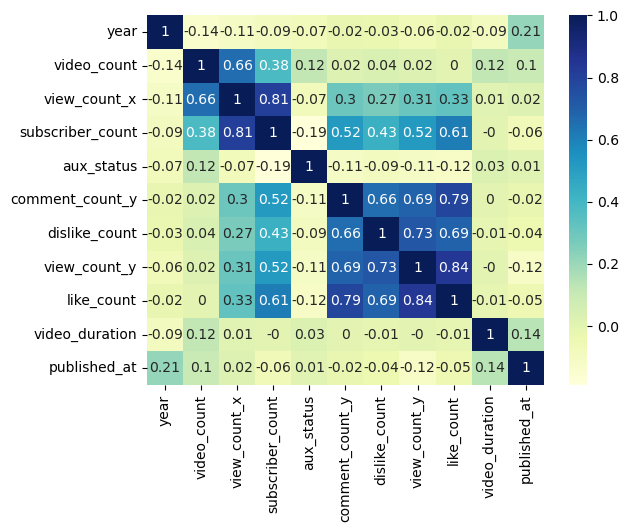

In [37]:
# Gerando a matriz de correlação
sns.heatmap(df_corr, annot=True, cmap="YlGnBu")

Alguns insights que podemos retirar da matriz de correlação são:

- A variável 'year' tem uma correlação negativa e fraca com as outras variáveis, ou seja, à medida que o tempo passa, não há uma forte relação linear com nenhuma outra variável.
- Há uma correlação moderada entre 'video_count' e 'view_count_x', indicando que a quantidade de vídeos publicados pode estar relacionada ao número de visualizações dos mesmos.
- Há uma correlação forte entre 'view_count_x' e 'subscriber_count', o que pode indicar que o crescimento do número de inscritos pode levar a um aumento no número de visualizações.
- Há uma correlação moderada entre 'subscriber_count' e 'comment_count_y' e 'like_count', sugerindo que o número de inscritos pode ser um fator importante para aumentar o engajamento nos vídeos.
- Há uma correlação moderada entre 'view_count_y' e as suas métricas, indicando que quanto mais visualizações um vídeo recebe, mais provável é que ele também receba mais likes, deslikes e comentários.

Analisando com mais detalhes de algumas colunas, desconsiderando valores extremos (por isso aplicando limite superior):

In [38]:
def plot_graficos(coluna, dataframe):
    # Filtrando os dados da coluna até o limite superior
    Q1 = dataframe[coluna].quantile(0.25)
    Q3 = dataframe[coluna].quantile(0.75)

    limite_superior = Q3 + 1.5 * (Q3 - Q1)
    df_limite_superior = dataframe[dataframe[coluna] <= limite_superior]

    # Criando uma grade 2x2 para os gráficos
    plt.figure(figsize=(10, 8))

    # Boxplot
    plt.subplot(2, 2, 1)
    sns.boxplot(x=coluna, data=df_limite_superior)
    plt.title(f'Boxplot de {coluna}')
    plt.xlabel(coluna)

    # Histograma
    plt.subplot(2, 2, 2)
    plt.hist(df_limite_superior[coluna], bins=30, edgecolor='k', alpha=0.7)
    plt.title(f'Histograma de {coluna}')
    plt.xlabel(coluna)
    plt.ylabel('Frequência')

    # Gráfico de Densidade
    plt.subplot(2, 2, 3)
    sns.kdeplot(df_limite_superior[coluna], shade=True)
    plt.title(f'Gráfico de Densidade de {coluna}')
    plt.xlabel(coluna)
    plt.ylabel('Densidade')

    # Gráfico de Violino
    plt.subplot(2, 2, 4)
    sns.violinplot(x=coluna, data=df_limite_superior, color='skyblue')
    plt.title(f'Gráfico de Violino de {coluna}')
    plt.xlabel(coluna)

    plt.tight_layout()
    plt.show()

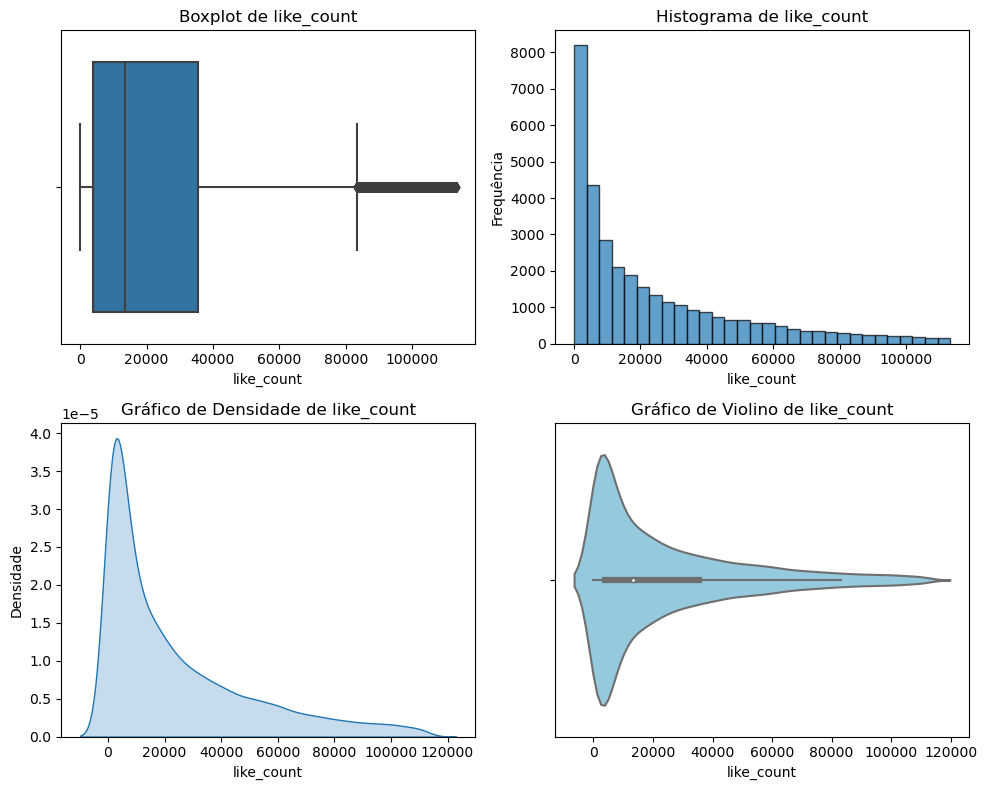

In [39]:
# Plotando graficos:
plot_graficos('like_count', df)

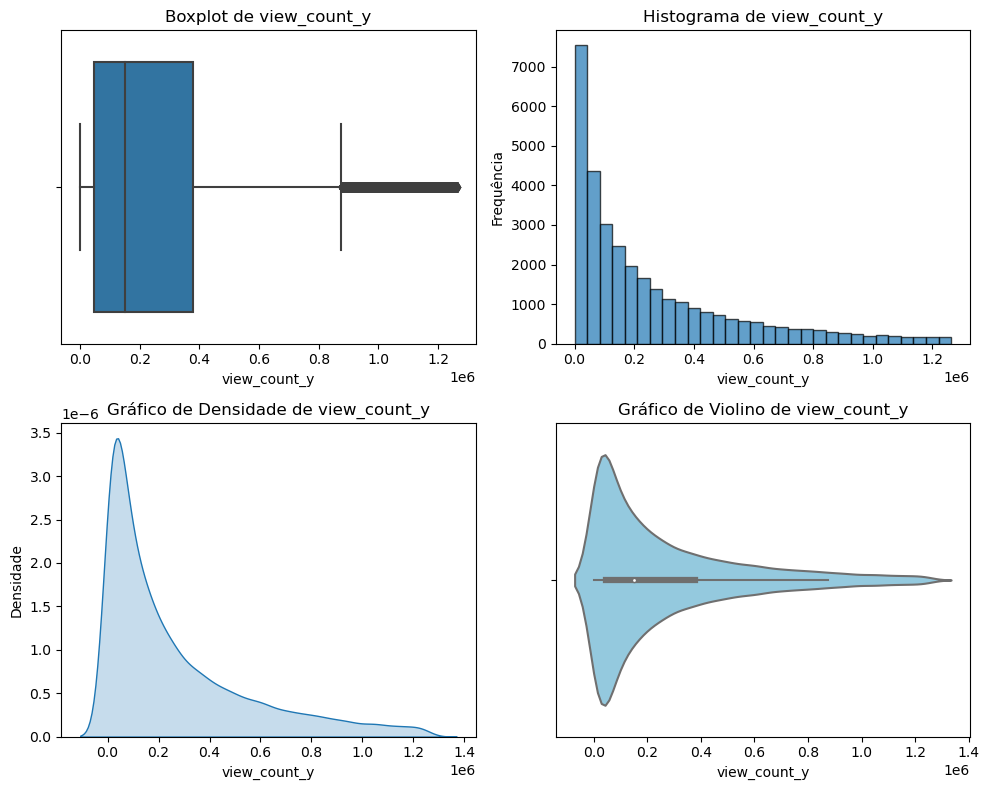

In [40]:
plot_graficos('view_count_y', df)

In [41]:
df['like_count'].describe()

count    3.664200e+04
mean     5.561968e+04
std      1.832877e+05
min      0.000000e+00
25%      4.462250e+03
50%      1.660000e+04
75%      4.798475e+04
max      5.527981e+06
Name: like_count, dtype: float64

In [42]:
df['view_count_y'].describe()

count    3.664200e+04
mean     6.493583e+05
std      2.075874e+06
min      5.400000e+01
25%      5.561125e+04
50%      1.868045e+05
75%      5.384255e+05
max      8.894125e+07
Name: view_count_y, dtype: float64

A discrepância nas ordens de magnitude das duas métricas é evidente, com valores extremamente altos em view_count_y e like_count. Esses valores extremos podem exercer uma influência desproporcional na métrica que será usada como variável alvo em um modelo de classificação a seguir.

Para mitigar esse desequilíbrio e garantir que os valores extremos não dominem o modelo, será adotada uma abordagem capaz de lidar com os outliers, tornando a feature `like_count` adequada para se utilizar como base à variável alvo de nosso modelo de classificação.

## Métrica de popularidade

Para garantir uma análise estatística precisa e confiável dos dados, é fundamental lidar com outliers, que são valores extremos que podem distorcer as conclusões e interpretações. Uma abordagem amplamente adotada para evitar que outliers impactem negativamente a análise é o uso do **Método Tukey**. Este método é eficaz na identificação e tratamento de outliers, permitindo uma análise mais robusta dos dados.

O Método Tukey é uma abordagem estatística que utiliza o cálculo do limite superior, uma fórmula que considera o terceiro quartil (Q3), o primeiro quartil (Q1) e o intervalo interquartil (IQR). O limite superior é calculado como:

<center>$LimiteSuperior = Q3 + 1.5 \times IQR$</center>

- $Q3$ é o terceiro quartil, que divide os 75% superiores dos dados.
- $Q1$ é o primeiro quartil, que divide os 25% inferiores dos dados.
- $IQR$ é o intervalo interquartil, a diferença entre $Q3$ e $Q1$, representando a dispersão central dos dados.

Segue imagem disponibilizada no artigo ["How to Detect, Handle and Visualize Outliers"](https://towardsdatascience.com/how-to-detect-handle-and-visualize-outliers-ad0b74af4af7):

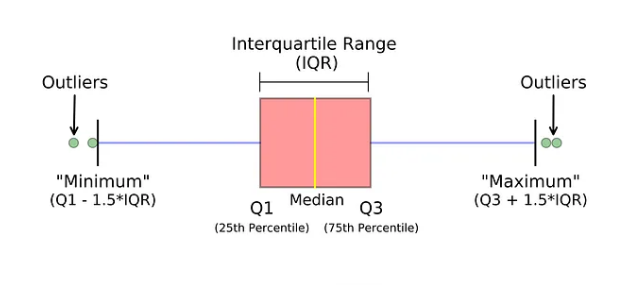

Portanto, a métrica de popularidade deve ser calculada em algumas etapas.

Na primeira etapa, calculamos o limite superior para cada categoria de vídeo. Isso é feito usando a função `transform` do pandas, que atribui o valor máximo de curtidas não consideradas outliers a cada instância pertencente à mesma categoria. 

In [43]:
# Etapa 1: Definindo e aplicando função para calcular o limite superior (Q3 + 1.5 * IQR) para cada categoria
def max_not_outlier(x):
    q1 = x.quantile(0.25)    # Calcula o primeiro quartil (Q1)
    q3 = x.quantile(0.75)    # Calcula o terceiro quartil (Q3)
    iqr = 1.5 * (q3 - q1)    # Calcula o intervalo interquartil (IQR)
    return q3 + iqr          # Calcula o limite superior (Q3 + 1.5 * IQR)

# Aplicando a função para cada categoria usando 'groupby' e criando uma nova coluna 'like_count_max'
df['like_count_max'] = df.groupby('category')['like_count'].transform(max_not_outlier)

Na **segunda etapa**, calculamos a métrica de popularidade para cada vídeo. A popularidade é determinada pela relação entre o número de curtidas individuais de um vídeo e o número máximo de curtidas na mesma categoria. 

Essa fórmula produz um valor entre 0 e 1, indicando a popularidade relativa do vídeo em relação aos outros da mesma categoria.

In [44]:
# Etapa 2: Calculando a métrica de popularidade para cada vídeo
df['popularity'] = df['like_count'] / df['like_count_max']

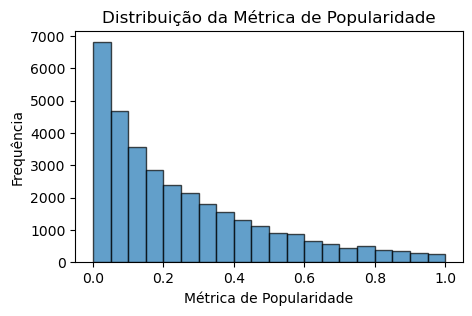

In [45]:
# Criando um histograma para visualizar distribuição da métrica de popularidade
plt.figure(figsize=(5, 3))
plt.hist(df['popularity'], bins=20, range=(0, 1), edgecolor='k', alpha=0.7)
plt.title('Distribuição da Métrica de Popularidade')
plt.xlabel('Métrica de Popularidade')
plt.ylabel('Frequência')
plt.show()

Na **terceira etapa**, classificamos os vídeos em três categorias de popularidade: "BAIXA", "MEDIA" e "ALTA". Isso é feito calculando os percentis da métrica de popularidade em cada categoria e atribuindo rótulos correspondentes.

Outra opção seria adicionar um quarto rótulo, para que nos valores que superam o limite superior (outliers) o vídeo seja considerado como "VIRAL".

Abordagem:

- `pd.cut`: Essa função divide os dados em intervalos com base em valores específicos fornecidos. Você define os pontos de corte explicitamente usando o parâmetro bins. Isso significa que você tem controle total sobre os intervalos em que deseja dividir seus dados, mas os tamanhos dos intervalos podem variar em termos de quantidade de dados que eles contêm. O número de elementos em cada intervalo pode ser desigual.

In [46]:
# Etapa 3: Calculando os percentis de popularidade em cada categoria (cut, intervalos não balanceados)
df['popularity'] = df.groupby('category')['popularity'].transform(
    lambda x: pd.cut(x, bins=[-0.1, 0.25, 0.75, float('inf')], labels=['BAIXA', 'MEDIA', 'ALTA']) # 0, 1, 2
)

# Opções de intervalo para ['BAIXA', 'MEDIA', 'ALTA'] (pd.cut -0.1 e 1.01)
# [-0.1, 0.25, 0.75, float('inf')] (1º), [-0.1, 0.33, 0.66, float('inf')] (2º)
# [-0.1, 0.33, 0.66, 1.01] (NaN),  [-0.1, 0.25, 0.75, 1.01] (NaN)

# Opções de rótulos ['BAIXA', 'MEDIA', 'ALTA', 'VIRAL'] (pd.cut -0.1 e 1.01)
# [-0.1, 0.33, 0.66, 1.00, float('inf')], [-0.1, 0.25, 0.75, 1.00, float('inf')] (3º)

Na quarta etapa, exibimos todas as categorias presentes no conjunto de dados junto com o valor máximo de curtidas para cada categoria. A lista é ordenada em ordem decrescente com base no valor máximo de curtidas. Isso nos permite ver quais categorias têm os vídeos mais populares em termos de curtidas.

In [47]:
# Etapa 4: Mostrando todas as categorias e seus respectivos like_count_max em ordem decrescente
category_max_likes = df[['category', 'like_count_max']].drop_duplicates().sort_values(by='like_count_max', ascending=False).reset_index(drop=True)
print(category_max_likes)

                            category  like_count_max
0                              Humor     1283631.750
1        Conhecimento e Curiosidades      518555.500
2                              Games      260213.375
3           Cultura e Entretenimento      216787.875
4                             Beleza      209236.500
5                            Família      128570.750
6   Economia, Política e Atualidades      124912.000
7                           Ciências      117997.500
8     Comportamento e Estilo de Vida      117966.125
9                            Esporte      115441.000
10                           Fitness       68503.250
11       Empreendedorismo e Negócios       68408.500
12                              Moda       65264.125
13                       Gastronomia       63933.375
14                           Militar       62540.000
15      Decoração, Organização e Diy       60288.500
16                          Política       52340.875
17  Meio Ambiente e Sustentabilidade       470

Na quinta etapa, analisamos a distribuição das classes na variável alvo ('popularity') para cada categoria. Isso nos dá uma visão detalhada de como a popularidade dos vídeos está distribuída dentro de cada categoria.

In [48]:
# Etapa 5: Mostrando a distribuição das classes na variável alvo para cada categoria
category_popularity_distribution = df.groupby(['category', 'popularity']).size().unstack(fill_value=0)
print(category_popularity_distribution)

popularity                        BAIXA  MEDIA  ALTA
category                                            
Beleza                              800    457   140
Cidades, Arquitetura e Urbanismo    314    153    52
Ciências                            112    349    55
Comportamento e Estilo de Vida      718    939   247
Conhecimento e Curiosidades        1338    243   352
Cultura e Entretenimento            571   1036   305
Decoração, Organização e Diy       1101    423   269
Economia, Política e Atualidades   1198    809   230
Educação                           1030    364   271
Empreendedorismo e Negócios        1349    563   284
Esporte                            1149    327   277
Família                             404    345    74
Fitness                             572    287   120
Games                              1542    763   329
Gastronomia                        1987    903   430
História                            133    150    41
Humor                               531    119

<Figure size 1000x1200 with 0 Axes>

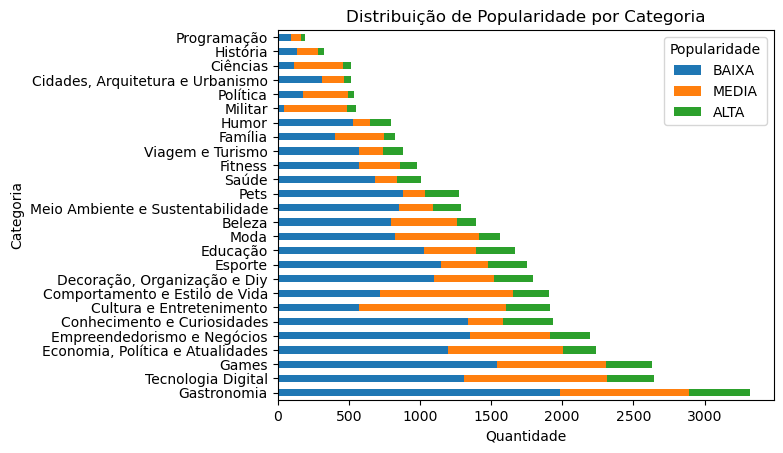

In [49]:
# Ordenando as categorias pelo número total de instâncias em ordem decrescente
category_popularity_distribution['Total'] = category_popularity_distribution.sum(axis=1)
category_popularity_distribution = category_popularity_distribution.sort_values(by='Total', ascending=False)
category_popularity_distribution.drop(columns='Total', inplace=True)

# Gráfico de barras horizontais empilhadas para mostrar a distribuição
plt.figure(figsize=(10, 12))
category_popularity_distribution.plot(kind='barh', stacked=True)
plt.title('Distribuição de Popularidade por Categoria')
plt.ylabel('Categoria')
plt.xlabel('Quantidade')
plt.legend(title='Popularidade', loc='upper right')
plt.show()

Na sexta etapa, verificamos a distribuição de cada rótulo ('BAIXA', 'MEDIA', 'ALTA') globalmente em todo o conjunto de dados. Isso nos ajuda a entender como os rótulos estão distribuídos em relação a todos os vídeos, independentemente da categoria.

In [50]:
# Etapa 6: Verificando a distribuição de cada rótulo globalmente
global_popularity_distribution = df['popularity'].value_counts(normalize=True)
print(global_popularity_distribution)

BAIXA    0.553572
MEDIA    0.310463
ALTA     0.135964
Name: popularity, dtype: float64


Na sétima etapa, verificamos a quantidade de vídeos associados a cada rótulo globalmente em todo o conjunto de dados. Isso nos fornece uma contagem absoluta de quantos vídeos se enquadram em cada categoria de popularidade.

In [51]:
# Etapa 7: Verificando a quantidade de cada rótulo globalmente
class_distribution = df['popularity'].value_counts()
print(class_distribution)

BAIXA    20284
MEDIA    11376
ALTA      4982
Name: popularity, dtype: int64


Na oitava etapa, geramos um gráfico de barras que mostra a distribuição de frequência para cada classe de popularidade ('BAIXA', 'MEDIA', 'ALTA'). Isso fornece uma representação visual da distribuição das classes na variável alvo.

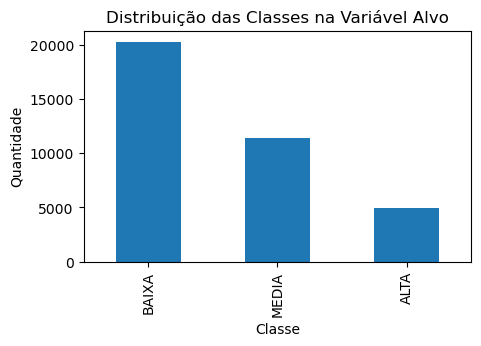

In [52]:
# Etapa 8: Verificando o gráfico de frequência para cada classe
plt.figure(figsize=(5, 3))
class_distribution.plot(kind='bar')
plt.title('Distribuição das Classes na Variável Alvo')
plt.xlabel('Classe')
plt.ylabel('Quantidade')
plt.show()

In [53]:
# Visualizando vídeos da categoria 'Programação' com popularidade mais 'ALTA'
df_programacao = df[(df['category'] == 'Programação') & (df['popularity'] == 'ALTA')]
df_programacao = df_programacao.sort_values(by='like_count', ascending=False)
df_programacao[['video_title','category','like_count','like_count_max','popularity',]].head(5)

,video_title,category,like_count,like_count_max,popularity
26428,3 Técnicas Que Eu Uso Para Aprender a Programa...,Programação,43462.0,23633.25,ALTA
26533,Programei 4 robôs que criam vídeos para mim no...,Programação,43410.0,23633.25,ALTA
26444,Descobri Como Consertar o Meu Maior Problema,Programação,35407.0,23633.25,ALTA
26563,Um júnior já deveria saber como reduzir a quan...,Programação,31492.0,23633.25,ALTA
26435,Eu fiz um dos melhores cursos de Programação d...,Programação,30521.0,23633.25,ALTA


In [54]:
# Visualizando vídeos da categoria 'Programação' com popularidade mais 'BAIXA' 
df_programacao = df[(df['category'] == 'Programação') & (df['popularity'] == 'BAIXA')]
df_programacao = df_programacao.sort_values(by='like_count', ascending=True)
df_programacao[['video_title','category','like_count','like_count_max','popularity',]].head(5)

,video_title,category,like_count,like_count_max,popularity
26514,Respondendo - Clean Code: 2 O que é código lim...,Programação,429.0,23633.25,BAIXA
26523,EU GANHEI UM TROFÉU DO PAGAR.ME!!!!,Programação,440.0,23633.25,BAIXA
26520,Nova categoria: Teoria,Programação,496.0,23633.25,BAIXA
26547,OpenHack: Venha acompanhar o Pitch Ao Vivo dos...,Programação,600.0,23633.25,BAIXA
26558,Como Lançar um Projeto Pessoal de Sucesso usan...,Programação,767.0,23633.25,BAIXA


## Feature Selection

In [55]:
df.dtypes

channel_id            object
category              object
gender                object
year                   int64
video_count            int64
view_count_x           int64
subscriber_count       int64
aux_status             int64
video_title           object
video_desc            object
comment_count_y      float64
dislike_count        float64
view_count_y         float64
like_count           float64
video_duration       float64
published_at           int64
like_count_max       float64
popularity          category
dtype: object

In [56]:
# Definindo colunas numéricas, categóricas e textuais
numeric_features = ['year', 'video_count', 'view_count_x', 'subscriber_count', 
                    'aux_status', 'comment_count_y','dislike_count', 'view_count_y',
                        'like_count', 'video_duration', 'published_at']

categorical_features = ['channel_id','category', 'gender']

textual_features = ['video_title', 'video_desc']

In [57]:
# Salvando modificações no DataFrame em arquivo CSV (data1 = sem processamento de texto, diferente de data2 e data3)
df.to_csv('data/data1.csv', index=False)

## Processamento de Linguagem Natural

In [58]:
# Carregando recursos
import re
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Download do conjunto de stopwords
nltk.download('stopwords')

# Carregar modelo spaCy para português
nlp = spacy.load('pt_core_news_sm')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\domaf\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


O foco desta etapa de pré-processamento nos textos é retirar padrões de **links** que são comuns no contexto de vídeos no YouTube, assim como evitar **#hashtags** e **@arrobas**, usuais em redes sociais.

In [59]:
def preprocess_text(text):
        
    # Convertendo para minúsculas
    text = text.lower()
    print(text)

    # Removendo links usando expressão regular
    text = re.sub(r'http\S+|www\.\S+', '', text)    
    print(text)
    
    # Removendo caracteres que não foram explicitados na expressão regular abaixo (#&%$@, emoji)
    text = re.sub(r'[^a-z0-9áâãêéîíôõóúûç\s]+', '', text)
    print(text)
    
    # Tokenizando usando spaCy
    doc = nlp(text)
    
    # Lematizando e removendo stopwords
    lemas = [token.lemma_ for token in doc if token.text not in stopwords.words('portuguese')]
    print(lemas)
    
    # Juntando os lemas em uma string
    preprocessed_text = ' '.join(lemas) 
    print(preprocessed_text)
    
    return preprocessed_text

In [60]:
"""
# Aplicando o pré-processamento aos textos
df['video_title'] = df['video_title'].apply(preprocess_text)
df['video_desc'] = df['video_desc'].apply(preprocess_text)
"""


"\n# Aplicando o pré-processamento aos textos\ndf['video_title'] = df['video_title'].apply(preprocess_text)\ndf['video_desc'] = df['video_desc'].apply(preprocess_text)\n"

In [61]:
"""
df[['video_title','video_desc']].head()

# Salvando modificações no DataFrame em arquivo CSV 
df.to_csv('data/data2.csv', index=False)
"""

"\ndf[['video_title','video_desc']].head()\n\n# Salvando modificações no DataFrame em arquivo CSV \ndf.to_csv('data/data2.csv', index=False)\n"

Testando outra abordagem de préprocessamento textual menos restritivo:

In [62]:
# Carregando dados sem pré-processamento
df_data3 = pd.read_csv('data/data1.csv')

In [63]:
# Versão SEM lematização 
"""
# Definindo pré-processamento dos textos menos restritivo
def preprocess_text_data3(text):
    
    # Convertendo para minúsculas
    text = text.lower()

    # Removendo links usando expressão regular
    text = re.sub(r'http\S+|www\.\S+', '', text)
    
    # Removendo caracteres que não foram explicitados na expressão regular abaixo (#&%$@, emoji)
    text = re.sub(r'[^a-z0-9áâãêéîíôõóúûç\s]+', '', text)    
    
    # Aplicando Tokenização
    tokens = word_tokenize(text)
    
    # Removendo Stopwords
    stop_words = set(stopwords.words('portuguese'))
    tokens = [word for word in tokens if word not in stop_words]
    
    return ' '.join(tokens)
"""

"\n# Definindo pré-processamento dos textos menos restritivo\ndef preprocess_text_data3(text):\n    \n    # Convertendo para minúsculas\n    text = text.lower()\n\n    # Removendo links usando expressão regular\n    text = re.sub(r'http\\S+|www\\.\\S+', '', text)\n    \n    # Removendo caracteres que não foram explicitados na expressão regular abaixo (#&%$@, emoji)\n    text = re.sub(r'[^a-z0-9áâãêéîíôõóúûç\\s]+', '', text)    \n    \n    # Aplicando Tokenização\n    tokens = word_tokenize(text)\n    \n    # Removendo Stopwords\n    stop_words = set(stopwords.words('portuguese'))\n    tokens = [word for word in tokens if word not in stop_words]\n    \n    return ' '.join(tokens)\n"

In [64]:
# Definindo pré-processamento dos textos 
def preprocess_text_data3(text):
    
    # Convertendo para minúsculas
    text = text.lower()

    # Removendo links usando expressão regular
    text = re.sub(r'http\S+|www\.\S+', '', text)
    
    # Removendo caracteres que não foram explicitados na expressão regular abaixo (#&%$@, emoji)
    text = re.sub(r'[^a-z0-9áâãêéîíôõóúûç\s]+', '', text)    
    
    # Aplicando Tokenização
    tokens = word_tokenize(text)
    
    # Removendo Stopwords
    stop_words = set(stopwords.words('portuguese'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Aplicando Lematização
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    return ' '.join(tokens)

In [65]:
# Aplicando o pré-processamento aos textos
df_data3['video_title'] = df_data3['video_title'].apply(preprocess_text_data3)
df_data3['video_desc'] = df_data3['video_desc'].apply(preprocess_text_data3)

In [66]:
df_data3[['video_title','video_desc']].head()

,video_title,video_desc
0,melhore vídeos técnica transição tutorial,manu matheus welove instagram loja contato
1,viagem carro costa rica,manu matheus welove n s s i n s t g r m loja c...
2,hotel 30 mil reais,convidados voo última hora agencia flow fazer ...
3,bolivia latam link video completo descrição,video completo link latam airline lançou vôo l...
4,quiz família pai filha contra pai filho,zyro acesse use código welove cadastrar ganhe ...


In [67]:
# Salvando modificações no DataFrame em arquivo CSV 
df_data3.to_csv('data/data3.csv', index=False)